In [18]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import anndata
import sc_utils
import scvi

Global seed set to 0
/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
import h5py
import hdf5plugin

In [3]:
pd.options.display.max_rows = 200

In [4]:
%config InlineBackend.figure_format = "retina"

# Explore dataset (via RNA)

## 1. Loading data

I used `h5py` with `hdf5plugin` packages to just read the data. Data is stored as dense matrix with already transformed values. What can we do

In [5]:
meta = pd.read_csv("../data/metadata.csv", index_col=0)

In [6]:
def read_h5_as_anndata(path, meta, key="train_cite_inputs"):
    f = h5py.File(path)
    expr = f[key]["block0_values"][:]
    genes = f[key]["axis0"].asstr()[:]
    cells = f[key]["axis1"].asstr()[:]
    obs = meta.loc[cells, :].copy()
    # I convert gene names to just symbols, but keep the ensembl id part
    var = pd.DataFrame(index=genes)
    var["ensembl_id"] = var.index.str.split("_").str[0]
    var.index = var.index.str.split("_").str[1]
    ds = anndata.AnnData(expr, obs=obs, var=var)
    ds.var_names_make_unique()
    return ds

In [7]:
train = read_h5_as_anndata("../data/train_cite_inputs.h5", meta)

/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [8]:
train

AnnData object with n_obs × n_vars = 70988 × 22050
    obs: 'day', 'donor', 'cell_type', 'technology'
    var: 'ensembl_id'

In [9]:
test = read_h5_as_anndata("../data/test_cite_inputs.h5", meta, key="test_cite_inputs")

/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [10]:
test

AnnData object with n_obs × n_vars = 48663 × 22050
    obs: 'day', 'donor', 'cell_type', 'technology'
    var: 'ensembl_id'

In [11]:
ds = train.concatenate([test])

/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


## 2. Basic preprocessing

Here are the provided cell annotation

In [17]:
ds.obs.cell_type.value_counts(dropna=False)

HSC     42874
EryP    24344
NeuP    21418
MasP    18090
MkP     10800
MoP      1822
BP        303
Name: cell_type, dtype: int64

**Important** We're provided cell annotation for test cells too!

In [14]:
ds.var['mito'] = ds.var_names.str.match("MT-")

Compute the regular QC metrics, but the caveat is that they are derived from log-transformed normalized counts

In [15]:
sc.pp.calculate_qc_metrics(ds, qc_vars=['mito'], percent_top=None, log1p=False, inplace=True)

In [16]:
ds.obs["sample"] = ds.obs.donor.astype(str) + "_" + ds.obs.day.astype(str)

<AxesSubplot: xlabel='sample', ylabel='n_genes_by_counts'>

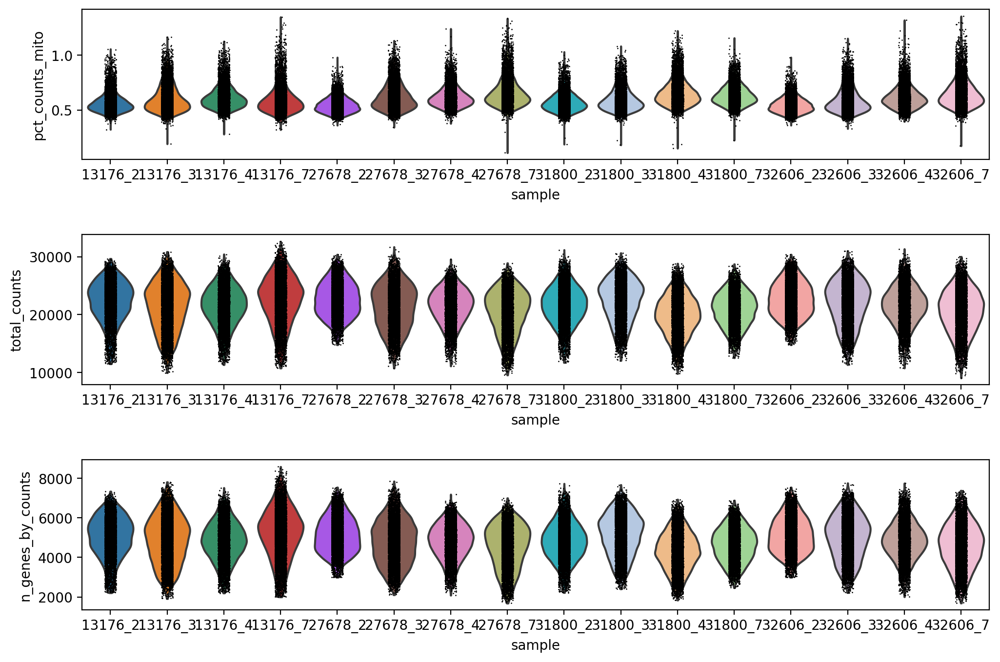

In [22]:
fig, axes = plt.subplots(
    nrows=3, 
    figsize=(12, 8), 
    gridspec_kw={"hspace": 0.5}
)
sc.pl.violin(ds, "pct_counts_mito", groupby="sample", ax=axes[0], show=False)
sc.pl.violin(ds, "total_counts", groupby="sample", ax=axes[1], show=False)
sc.pl.violin(ds, "n_genes_by_counts", groupby="sample", ax=axes[2], show=False)

## 3. Cell type composition

In [23]:
cell_types = pd.crosstab(ds.obs.cell_type, ds.obs["sample"])

In [24]:
cell_types = cell_types / cell_types.sum(axis="rows")

Let's plot cell type composition per sample, normalized by row:  
— black is minimum per row (not necessary 0)  
— bright beige is maximum per row

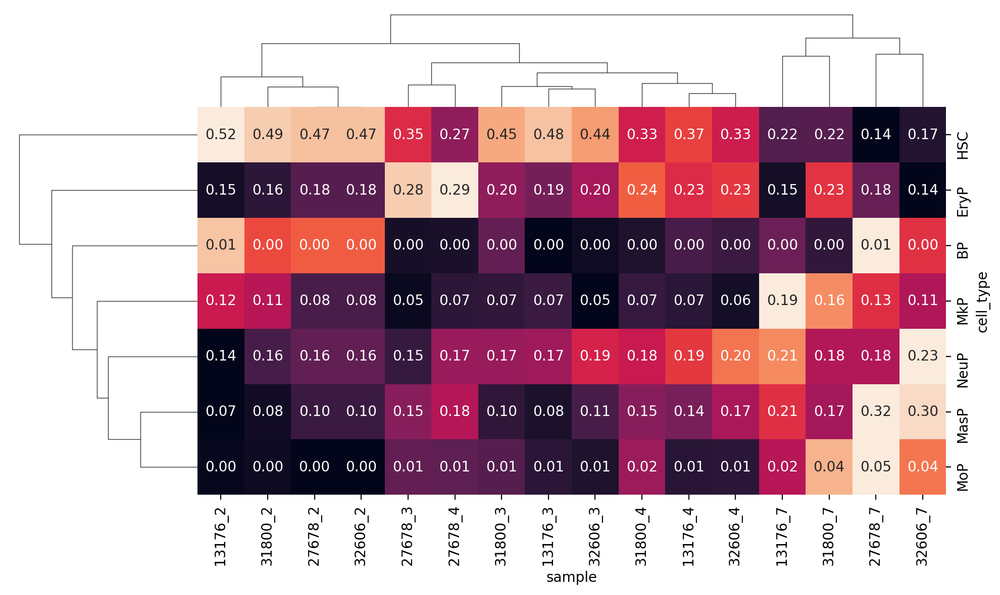

In [26]:
sns.clustermap(
    cell_types,
    standard_scale=0,
    figsize=(10, 6),
    cbar_pos=None,
    fmt=".2f",
    annot=cell_types
)

Here black actually means 0

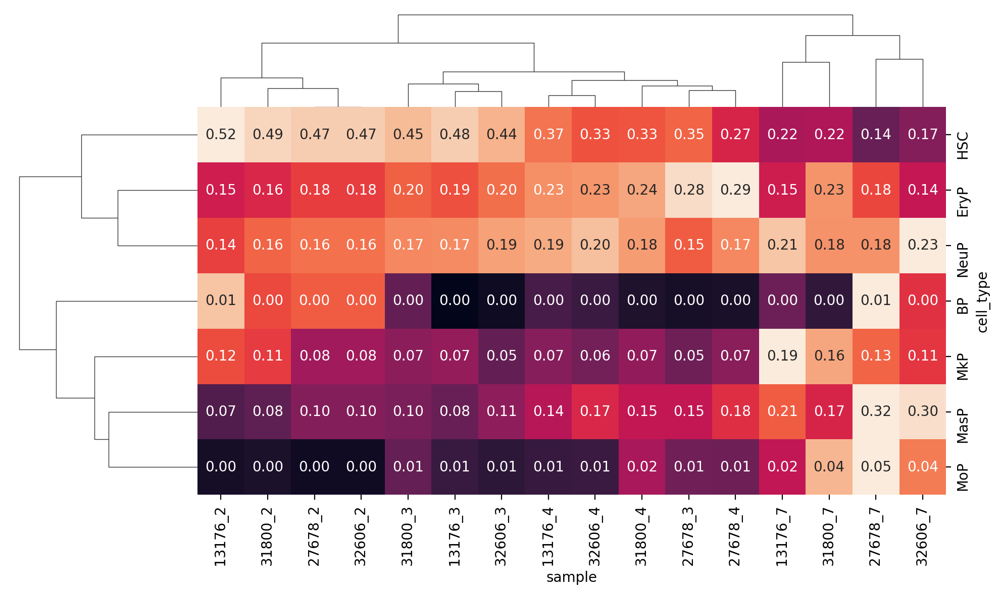

In [27]:
sns.clustermap(
    cell_types.div(cell_types.max(axis="columns"), axis="rows"),
    # standard_scale=0,
    figsize=(10, 6),
    cbar_pos=None,
    fmt=".2f",
    annot=cell_types
)

**Results:**
* samples change over time
* samples change over time in mostly consistent manner
* BP are seen almost exclusively at day 2 and then at day 7 — inconsistent, likely due to random sampling

**Plot trends per cell type**

In [45]:
test_batches = ds.obs["sample"][ds.obs.batch.eq("1")].unique()

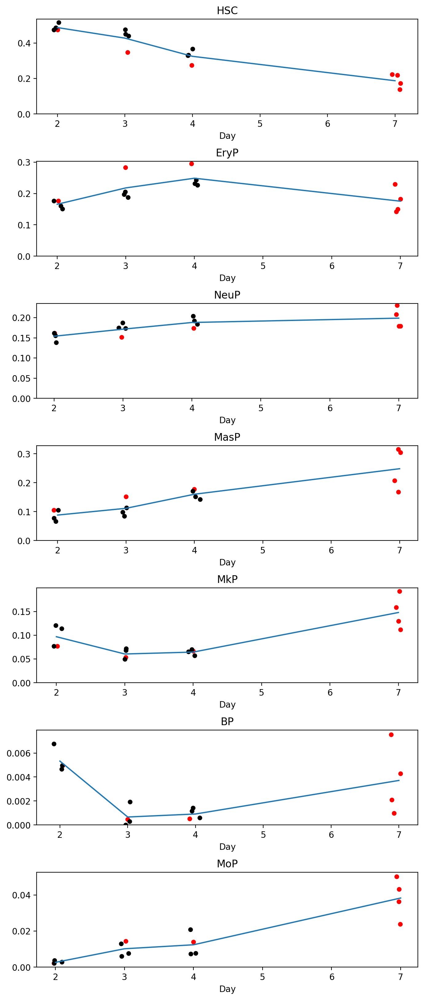

In [52]:
fig, axes = plt.subplots(
    nrows=ds.obs["cell_type"].nunique(), 
    figsize=(8, 20), 
    gridspec_kw={"hspace": 0.5}
)
for i, cell_type in enumerate(ds.obs["cell_type"].unique()):
    df = cell_types.T.loc[:, [cell_type]]
    df["day"] = df.index.str.split("_").str[1].astype(int)
    df["is_test"] = df.index.isin(test_batches)
    mean_df = df.groupby("day")[cell_type].mean()
    axes[i].plot(mean_df.index, mean_df)
    axes[i].scatter(
        df.day + np.random.normal(scale=0.05, size=df.shape[0]), 
        df[cell_type], 
        s=20, 
        c=df.is_test, 
        cmap=mpl.colors.ListedColormap(["black", "red"])
    )
    axes[i].set_ylim(0)
    axes[i].set_title(cell_type)
    axes[i].set_xlabel("Day")

**Conclusions**:
* red is `test` sample (where we should predict)
* HSC are stable decline
* EryP are increase-decrease, with public test being quite different
* NeuP are stable slow increase
* MasP are stable increase with more variability at day 7
* MkP are going down but then are up again at day 7
* BP behave the same as MkP
* MoP are steady increase with higher variability at day 7

Check donor sex

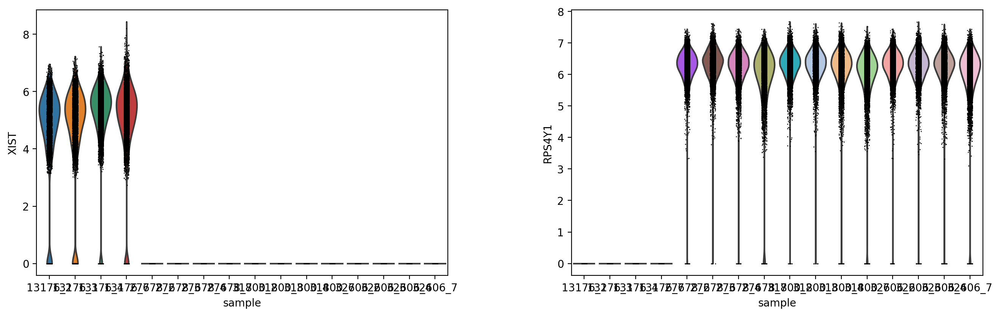

In [31]:
sc.pl.violin(ds, ["XIST", "RPS4Y1"], groupby="sample")

**Results**:
* 1 female donor (13176)
* 3 male (31800, 32606)

## 4. Standard clustering analysis

Check batch effect for HVG selection

In [55]:
hvg_no_batch = sc.pp.highly_variable_genes(
    ds, 
    flavor="seurat",
    n_top_genes=2000,
    inplace=False
)

In [56]:
hvg_batch = sc.pp.highly_variable_genes(
    ds,
    flavor="seurat",
    n_top_genes=2000,
    inplace=False,
    batch_key="sample"
)

/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/projects/b1038/Pulmonary/nm

In [64]:
hvg_batch = hvg_batch.index[hvg_batch.highly_variable]

In [65]:
hvg_no_batch = ds.var_names[hvg_no_batch.highly_variable]

In [68]:
np.intersect1d(hvg_batch, hvg_no_batch).size / 2000

0.732

**Conclusion**:
* 73% of HVG are the same if selecting with/without batch effect
* after manual examination of unique genes, I like HVG selection without batch effect

In [71]:
sc.pp.highly_variable_genes(
    ds, 
    flavor="seurat",
    n_top_genes=2000,
    inplace=True
)

In [73]:
ds.raw = ds

In [74]:
ds = ds[:, ds.var.highly_variable]

In [80]:
sc.pp.scale(ds, max_value=10)

/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [81]:
sc.tl.pca(ds, svd_solver='arpack')

In [82]:
ds.obs.donor = ds.obs.donor.astype(str)
ds.obs.day = ds.obs.day.astype(str)

/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


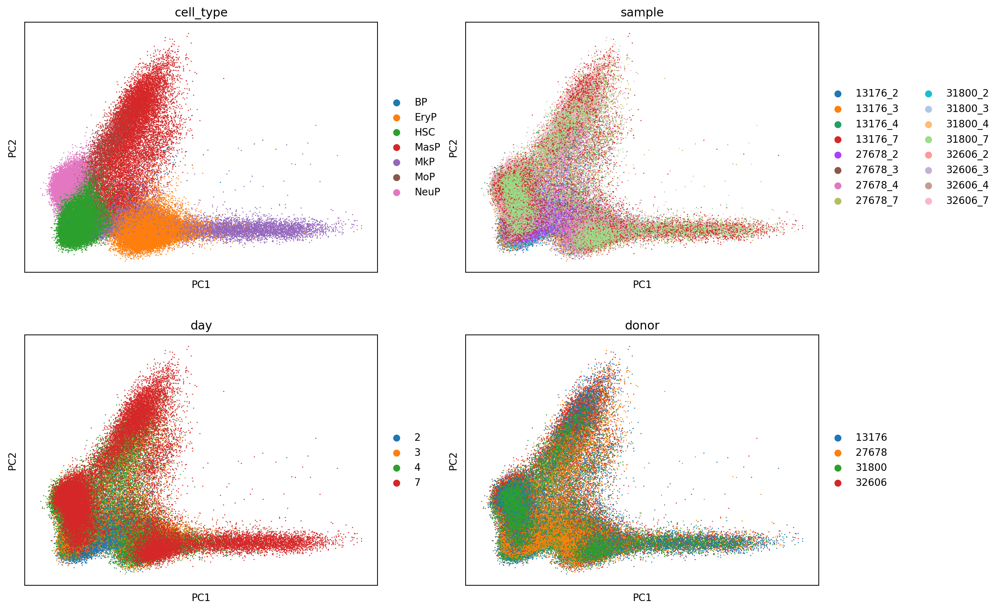

In [83]:
sc.pl.pca(ds, color=['cell_type', "sample", "day", "donor"], size=5, ncols=2)

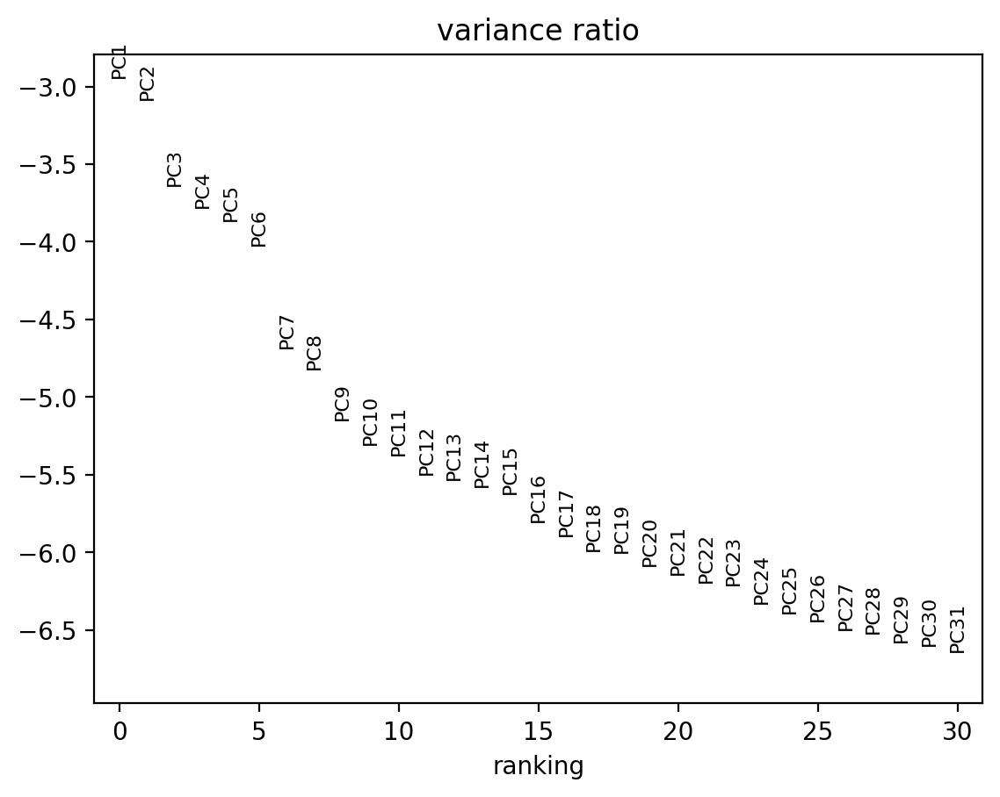

In [84]:
sc.pl.pca_variance_ratio(ds, log=True)

In [85]:
sc.pp.neighbors(ds, n_neighbors=10, n_pcs=7)

In [86]:
sc.tl.leiden(ds, resolution=0.5)

In [87]:
sc.tl.paga(ds)

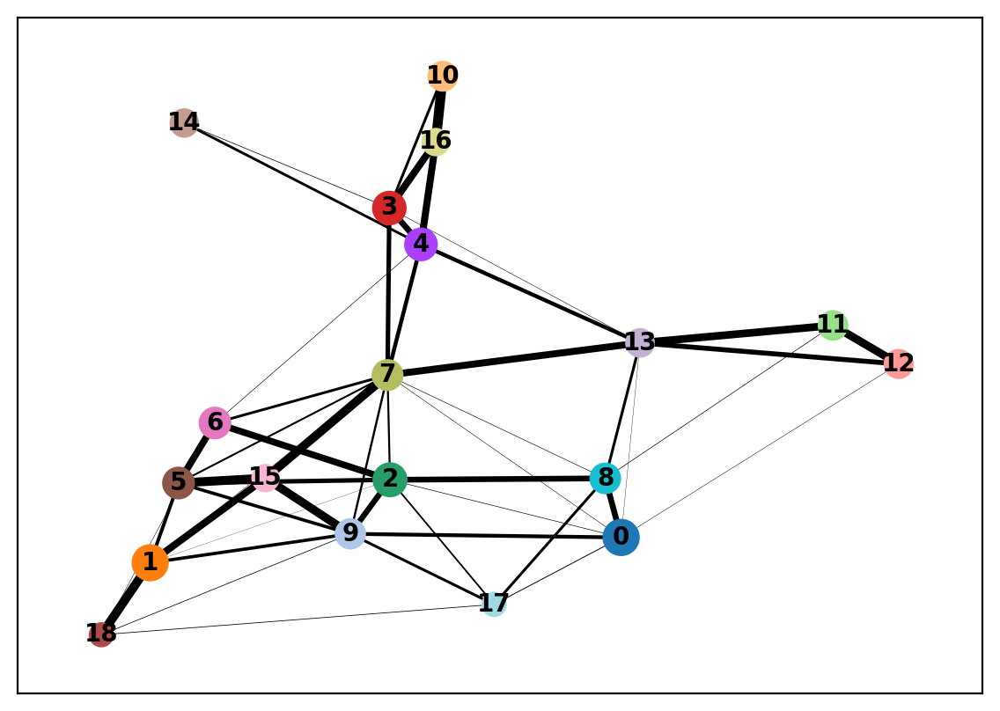

In [88]:
sc.pl.paga(ds)

In [89]:
sc.tl.umap(ds, init_pos='paga')

/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


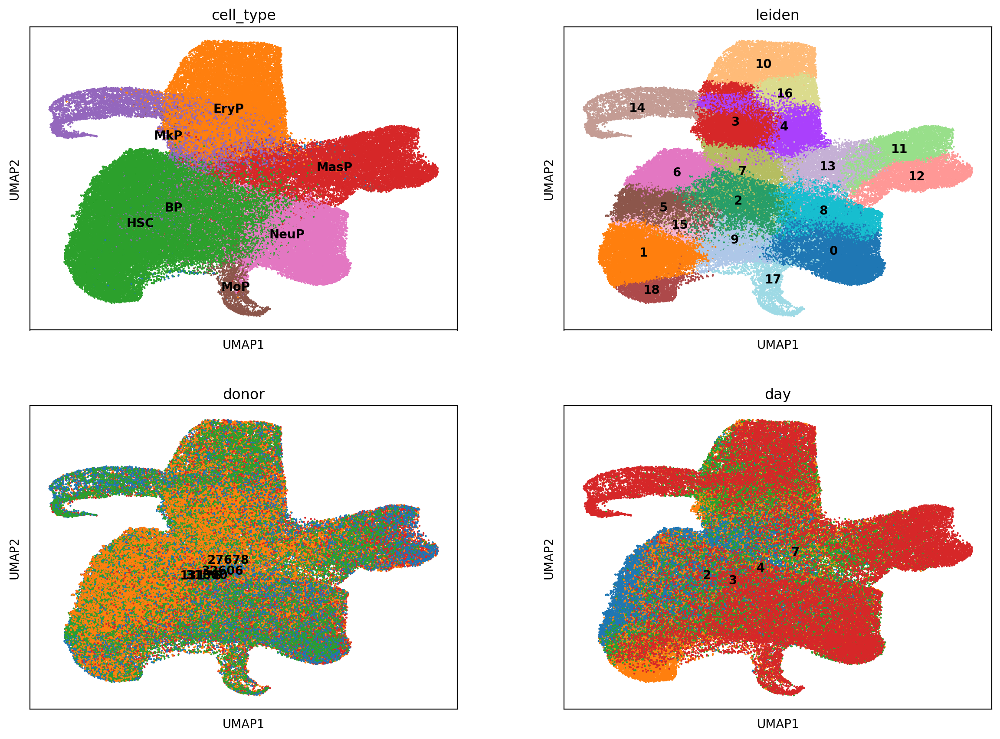

In [90]:
sc.pl.umap(ds, color=["cell_type", "leiden", "donor", "day"], size=10, legend_loc="on data", ncols=2)

**Results**:
* integration looks pretty good, no need for batch effect correction, additional integration
* for MoP, MasP leiden clusters agree with the provided labels
* for other cell types there are disagreements
* **NB** this is only one HVG/PC/Resolution snapshot

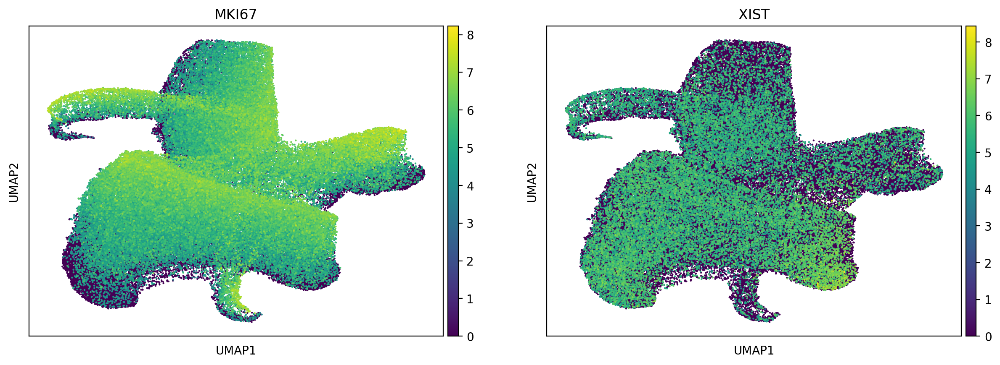

In [91]:
sc.pl.umap(ds, color=["MKI67", "XIST"], size=10)

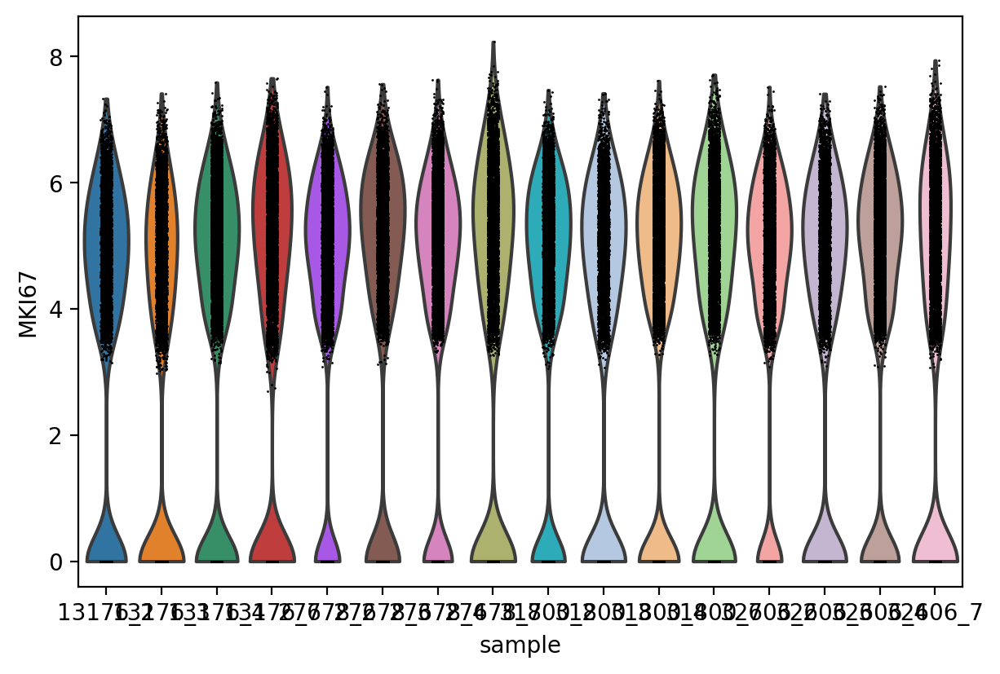

In [92]:
sc.pl.violin(ds, "MKI67", groupby="sample")

**Results**:
* There seems to be no batch effect between samples based on MKI67 expression

In [93]:
sc.tl.rank_genes_groups(ds, 'leiden', method='t-test', n_genes=50)

In [94]:
markers = sc_utils.get_markers(ds, "leiden")

In [95]:
markers.cluster = markers.cluster.astype(int)
markers.sort_values(["cluster", "avg_logFC"], ascending=[True, False], inplace=True)

In [96]:
markers.groupby("cluster").head(5)

,p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
14,0.0,7.538352,0.830981,0.254526,0.0,0,PRTN3
0,0.0,7.307207,0.998946,0.741458,0.0,0,MPO
20,0.0,7.248217,0.794242,0.232415,0.0,0,ELANE
19,0.0,7.215302,0.769505,0.141696,0.0,0,AZU1
29,0.0,6.341584,0.659854,0.055460,0.0,0,PLPPR3
65,0.0,4.967683,0.894763,0.387148,0.0,1,AVP
50,0.0,4.504794,0.984591,0.555682,0.0,1,SPINK2
96,0.0,4.050955,0.834194,0.357980,0.0,1,HOPX
76,0.0,2.872028,0.975494,0.784709,0.0,1,FAM30A
73,0.0,2.731528,0.984182,0.794286,0.0,1,CD52


## 5. Trajectory analysis

Based on scanpy tutorial https://scanpy-tutorials.readthedocs.io/en/latest/paga-paul15.html

In [102]:
sc.tl.diffmap(ds)

/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


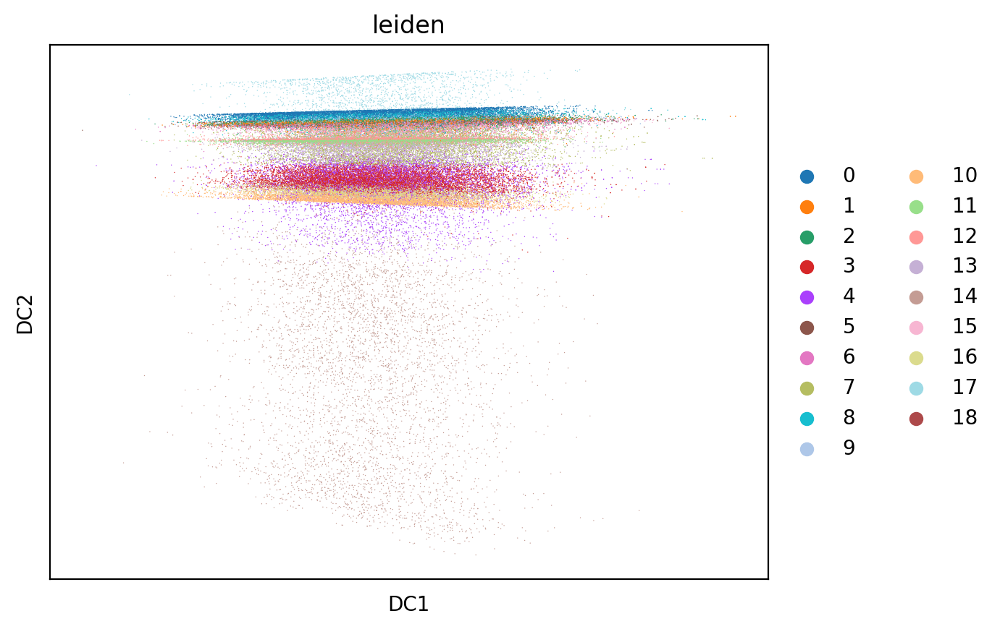

In [103]:
sc.pl.diffmap(ds, color=["leiden"], dimensions=(0, 1))

**Results**:
* As mentioned in docs, DC1 is not interesting for cell type

/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


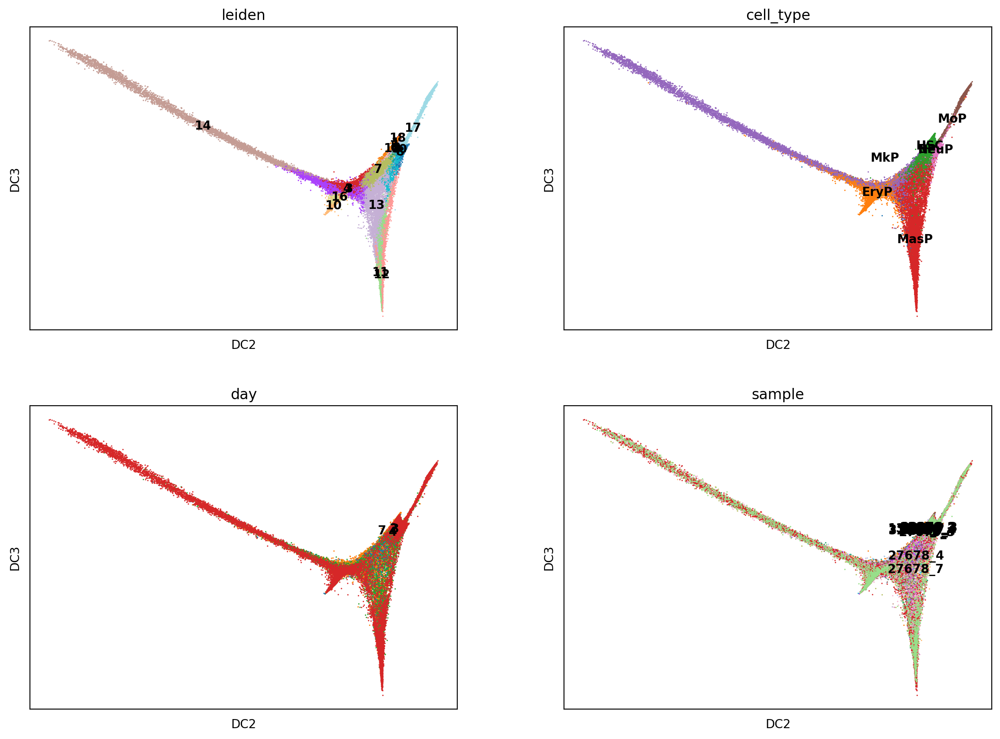

In [104]:
sc.pl.diffmap(
    ds, 
    color=["leiden", "cell_type", "day", "sample"], 
    dimensions=(1, 2), 
    legend_loc="on data", 
    size=5,
    ncols=2
)

**Results**:
* this looks promising!!
* we have a separate cluster (12) for different MkP cells

Let's remove the first DC

In [105]:
ds.obsm["X_diffmap"] = ds.obsm["X_diffmap"][:, 1:]

In [106]:
sc.pp.neighbors(ds, n_neighbors=10, use_rep='X_diffmap', key_added="diff_neighbors")

In [125]:
sc.tl.leiden(ds, resolution=1, neighbors_key="diff_neighbors", key_added="diff_leiden")

In [127]:
sc.tl.paga(ds, groups='diff_leiden')

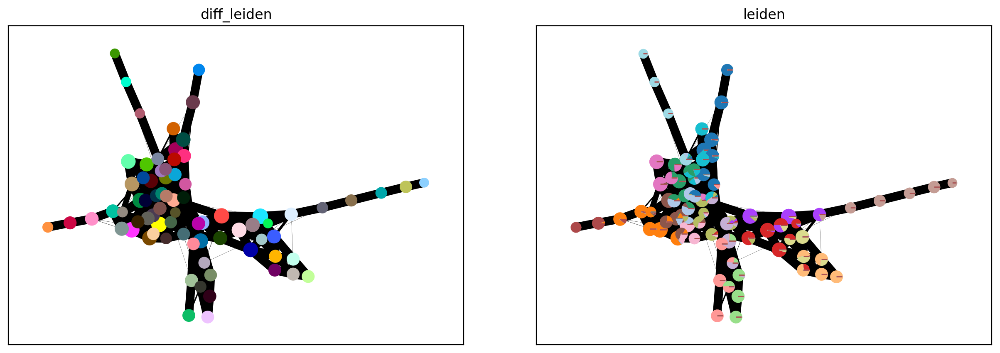

In [128]:
sc.pl.paga(ds, color=["diff_leiden", "leiden"], labels=[""] * ds.obs.diff_leiden.nunique())

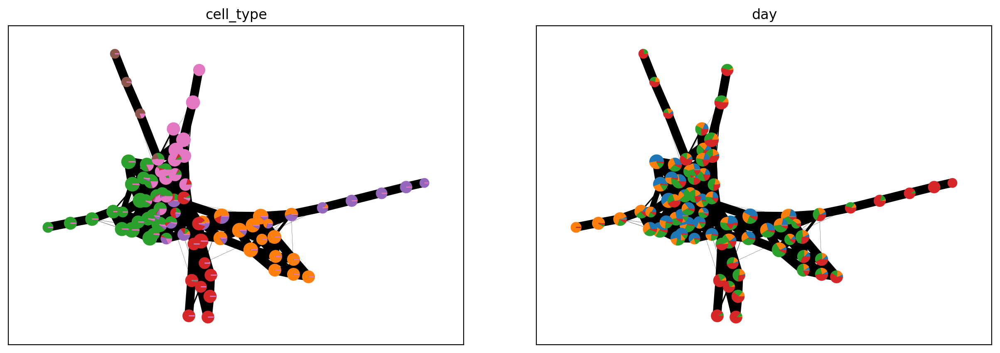

In [130]:
sc.pl.paga(ds, color=["cell_type", "day"], labels=[""] * ds.obs.diff_leiden.nunique())

In [136]:
ds.obs.groupby("diff_leiden").apply(lambda x: x.day.eq("2").sum() / x.shape[0]).sort_values().iloc[-1:]

diff_leiden
56    0.744787
dtype: float64

In [137]:
ds.uns['iroot'] = np.flatnonzero(ds.obs.diff_leiden.eq("56"))[0]

In [138]:
sc.tl.dpt(ds, n_dcs=14)

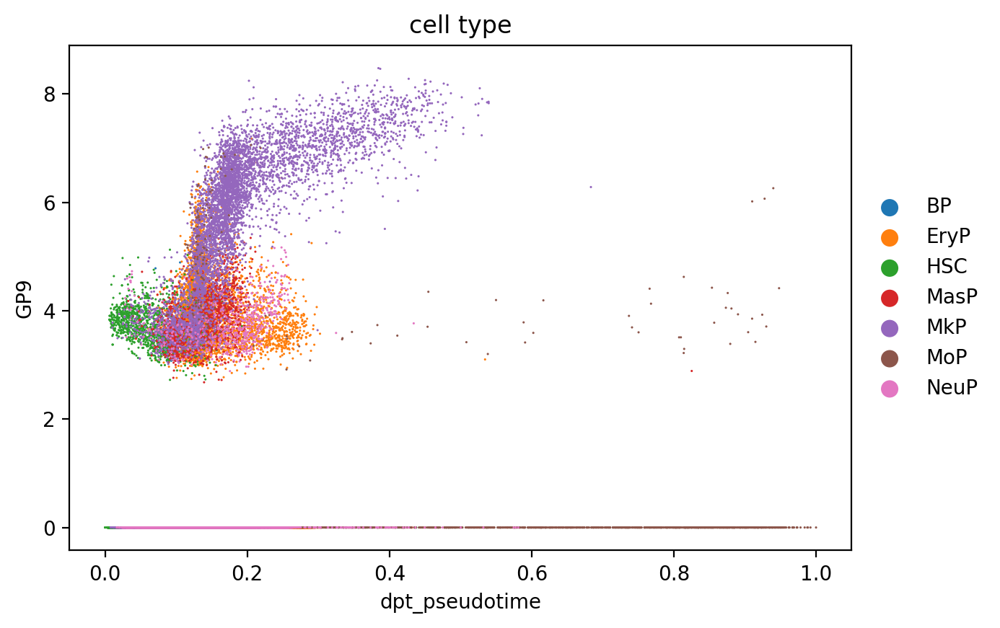

In [139]:
sc.pl.scatter(ds, x="dpt_pseudotime", y="GP9", color="cell_type", size=5)

/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


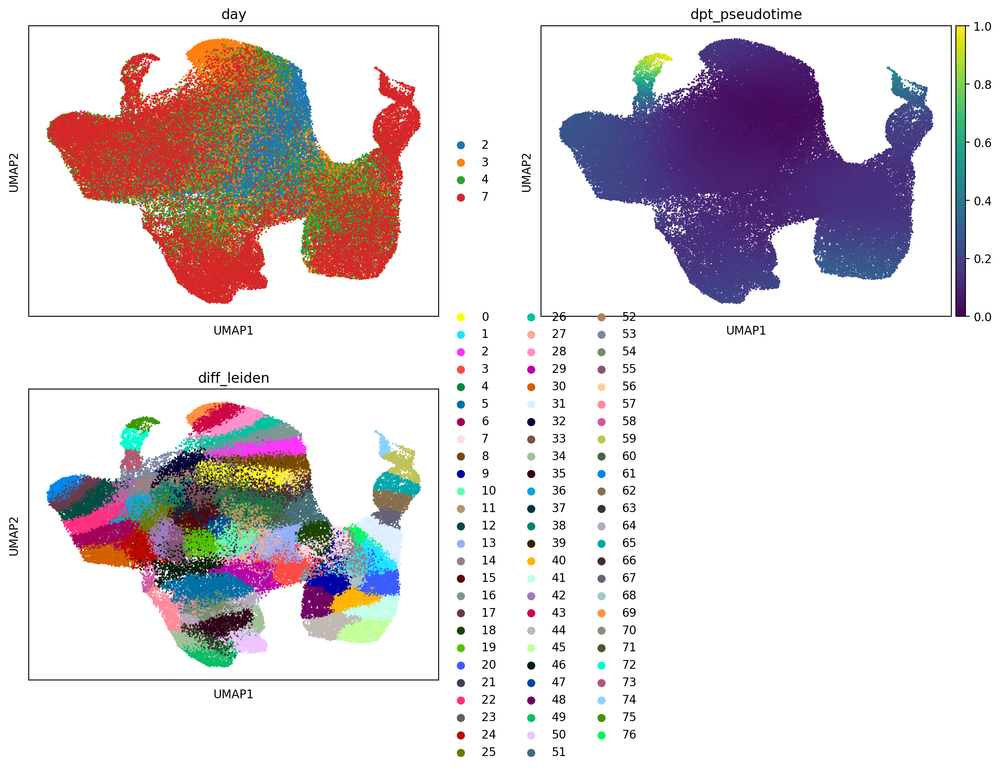

In [140]:
sc.pl.umap(ds, color=["day", "dpt_pseudotime", "diff_leiden"], size=10, ncols=2)

**Results**:
* I like this striped cluster separation of `diff_leiden`, it suggests different stages of maturation
* day 2 cells occupy space in the center and don't have overlapping cells, which sounds good
* top orange is day 3, and this lineage is strange because it is not followed by any cells from days 4 and 7
* I wonder, what is this lineage

/projects/b1038/Pulmonary/nmarkov/2022-multimodal/code/venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


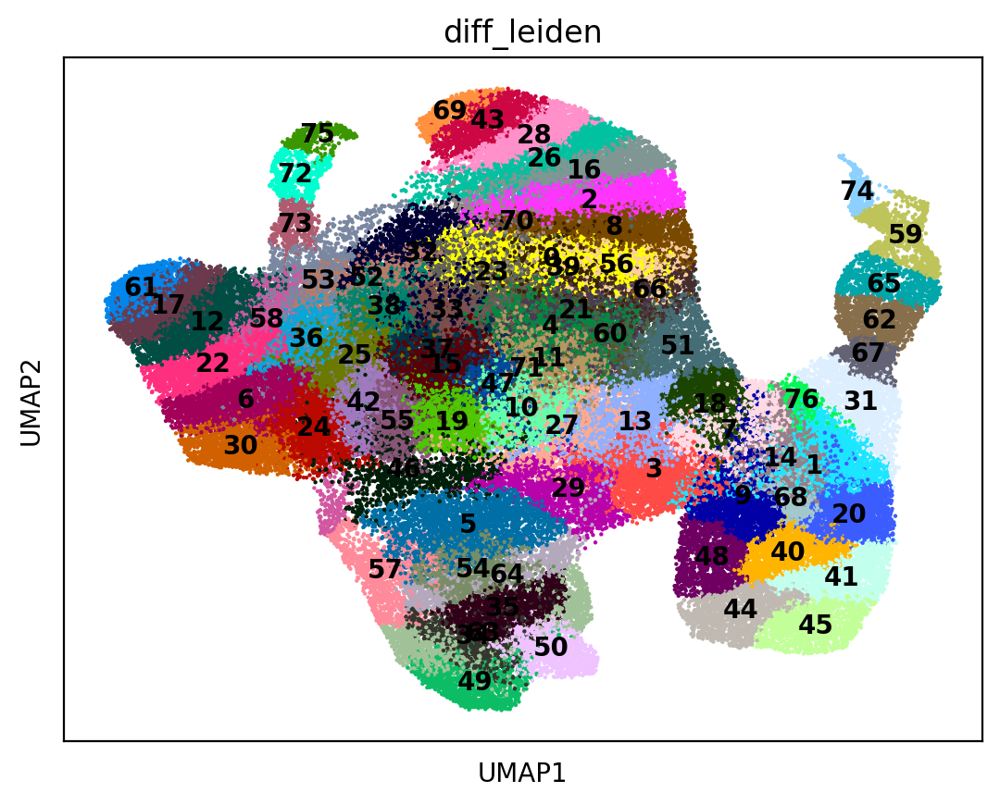

In [141]:
sc.pl.umap(ds, color="diff_leiden", size=10, legend_loc="on data")

In [143]:
ds.obs[ds.obs.diff_leiden.isin(["69", "43"])].day.value_counts()

3    1888
4      70
7      48
2      23
Name: day, dtype: int64

In [144]:
ds.obs[ds.obs.diff_leiden.isin(["69", "43"])].donor.value_counts()

13176    741
32606    553
31800    473
27678    262
Name: donor, dtype: int64

In [146]:
sc.tl.rank_genes_groups(ds, groupby="diff_leiden", groups=["69", "43"], n_genes=50, method="t-test")

In [147]:
markers = sc_utils.get_markers(ds, "diff_leiden")

In [154]:
markers.sort_values(["cluster", "avg_logFC"], ascending=[True, False]).groupby("cluster").head(10)

,p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
61,0.000000e+00,5.586424,0.964055,0.432733,0.000000e+00,43,AVP
85,0.000000e+00,4.624470,0.947520,0.461695,0.000000e+00,43,GLIPR1
53,0.000000e+00,4.308082,0.993530,0.594783,0.000000e+00,43,SPINK2
50,0.000000e+00,4.013541,1.000000,0.801860,0.000000e+00,43,FAM30A
51,0.000000e+00,3.707211,1.000000,0.811458,0.000000e+00,43,CD52
88,0.000000e+00,2.837028,0.990654,0.855877,0.000000e+00,43,HLA-DPB1
52,0.000000e+00,2.672917,1.000000,0.935557,0.000000e+00,43,VIM
92,0.000000e+00,2.513640,0.991373,0.882336,0.000000e+00,43,HLA-DPA1
99,0.000000e+00,2.427791,0.989935,0.897920,0.000000e+00,43,HLA-E
73,0.000000e+00,2.394718,0.997124,0.913073,0.000000e+00,43,HLA-DRA


In [153]:
markers.sort_values(["cluster", "pct.2"]).groupby("cluster").head(10)

,p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
61,0.000000e+00,5.586424,0.964055,0.432733,0.000000e+00,43,AVP
85,0.000000e+00,4.624470,0.947520,0.461695,0.000000e+00,43,GLIPR1
53,0.000000e+00,4.308082,0.993530,0.594783,0.000000e+00,43,SPINK2
50,0.000000e+00,4.013541,1.000000,0.801860,0.000000e+00,43,FAM30A
51,0.000000e+00,3.707211,1.000000,0.811458,0.000000e+00,43,CD52
88,0.000000e+00,2.837028,0.990654,0.855877,0.000000e+00,43,HLA-DPB1
92,0.000000e+00,2.513640,0.991373,0.882336,0.000000e+00,43,HLA-DPA1
99,0.000000e+00,2.427791,0.989935,0.897920,0.000000e+00,43,HLA-E
73,0.000000e+00,2.394718,0.997124,0.913073,0.000000e+00,43,HLA-DRA
52,0.000000e+00,2.672917,1.000000,0.935557,0.000000e+00,43,VIM


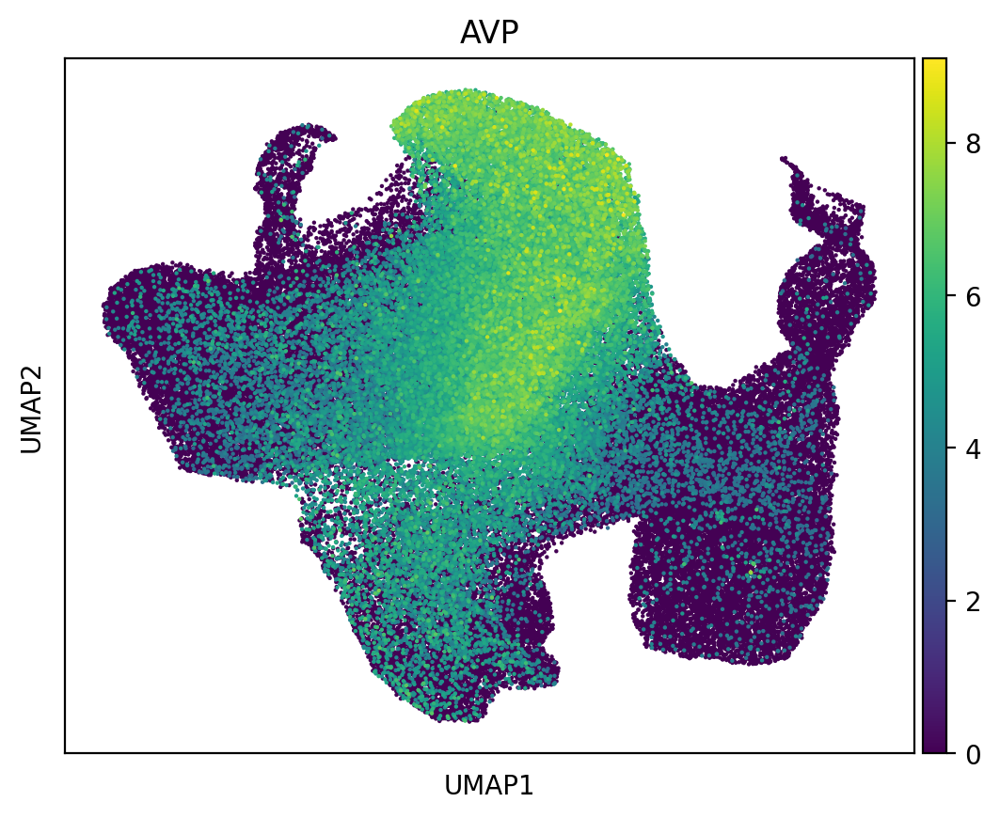

In [150]:
sc.pl.umap(ds, color="AVP", size=10, legend_loc="on data")

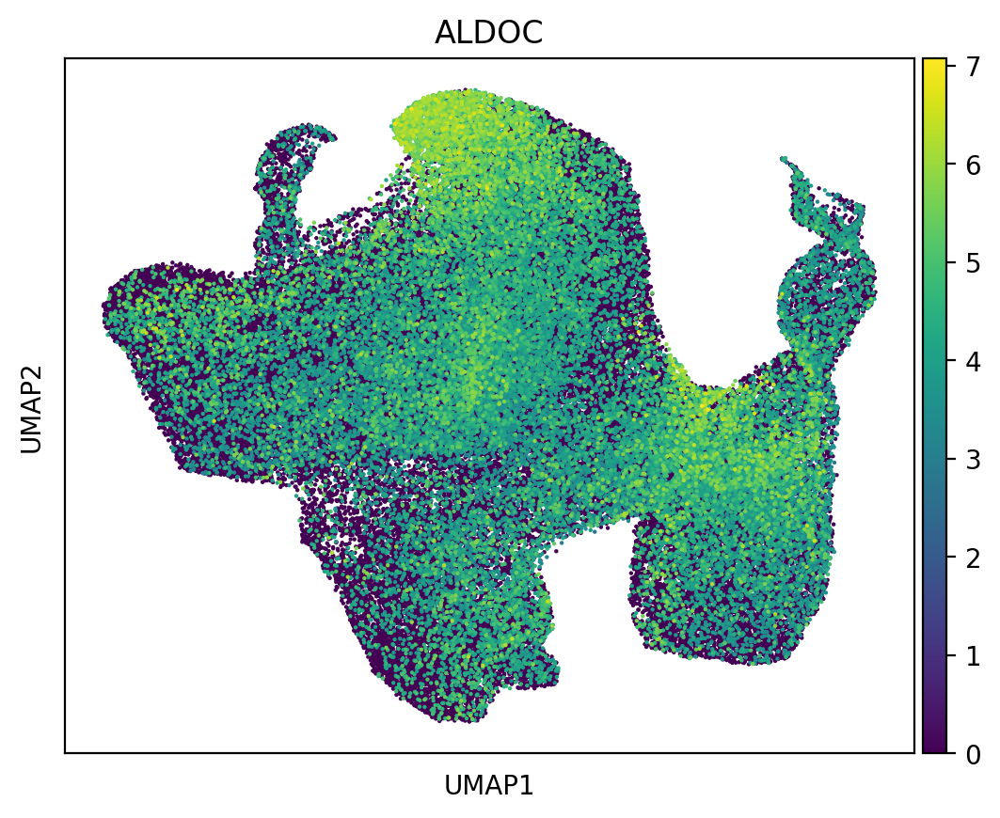

In [155]:
sc.pl.umap(ds, color="ALDOC", size=10)

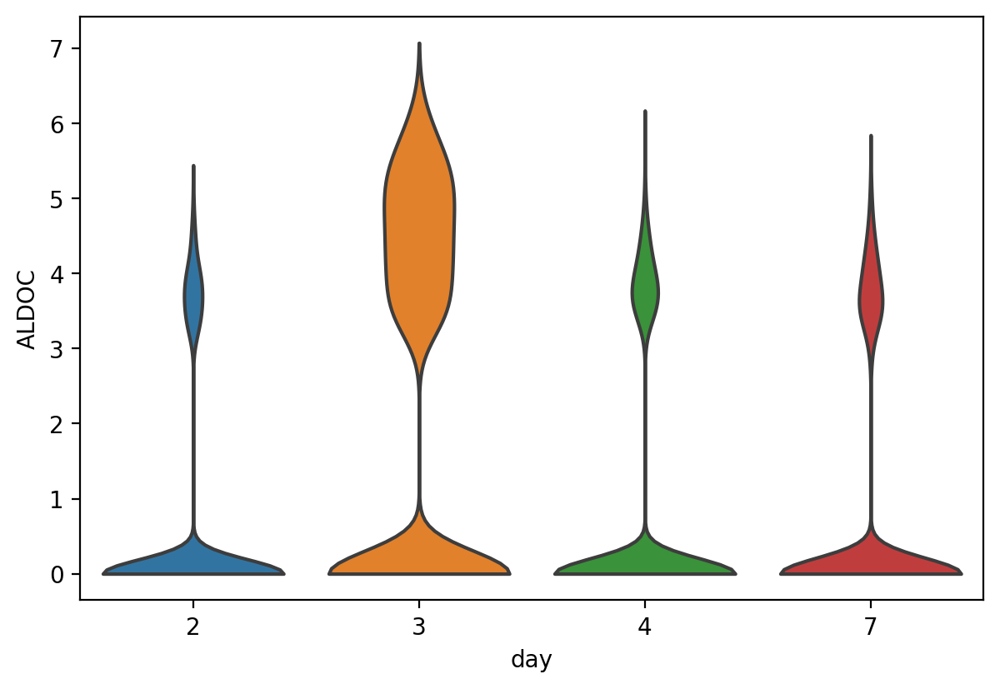

In [161]:
sc.pl.violin(ds, "ALDOC", groupby="day", size=0)

This is strange, I don't know what this tip of the UMAP specific to day 3 is:
* FAM30A is specific to Plasmablasts and B cells [here](http://cells.ucsc.edu/?ds=multimodal-pbmc+sct&gene=FAM30A)
* GLIPR2 is specific to Lymphocytes [here](http://cells.ucsc.edu/?ds=multimodal-pbmc+sct&gene=GLIPR2)
* AVP is not expressed much except for HSPC

## 6. Composition plots

<AxesSubplot: title={'center': 'Cell_type by day'}>

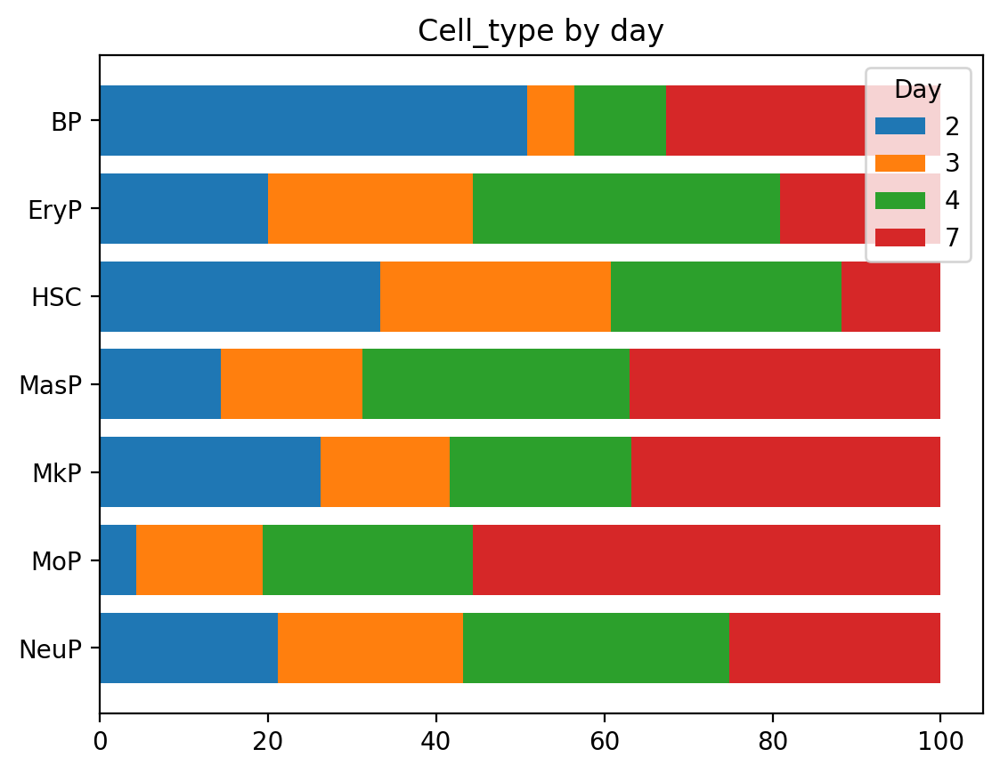

In [97]:
sc_utils.plot_composition(ds, group_by="cell_type", color="day", relative=True)

<AxesSubplot: title={'center': 'Cell_type by day'}>

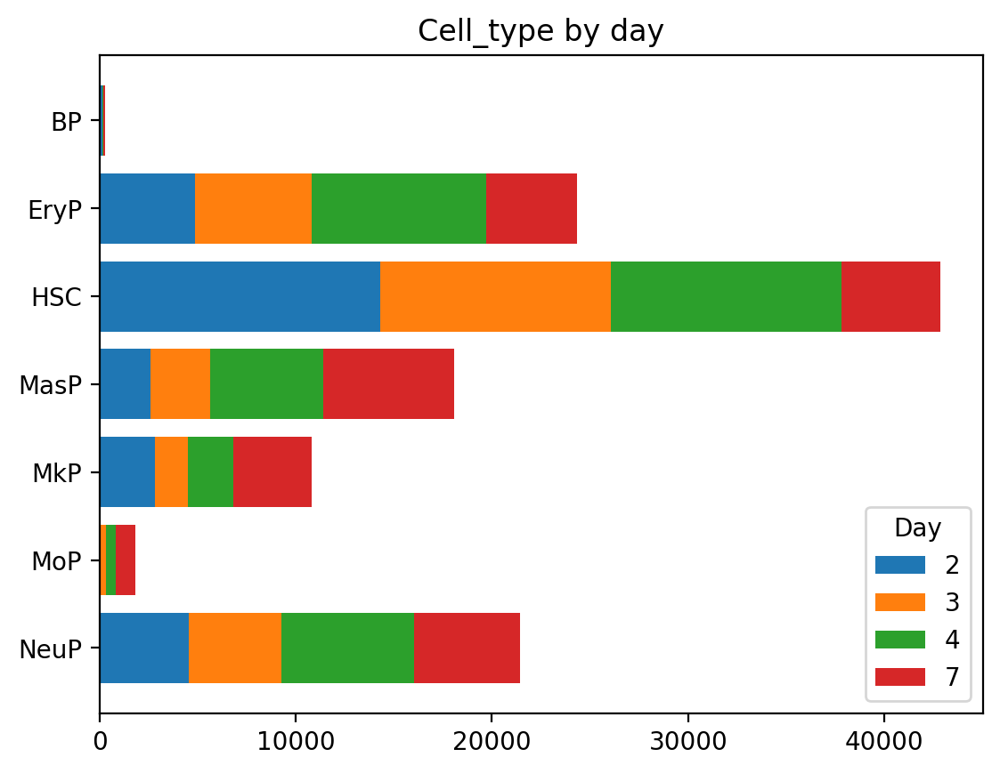

In [98]:
sc_utils.plot_composition(ds, group_by="cell_type", color="day")

<AxesSubplot: title={'center': 'Leiden by cell_type'}>

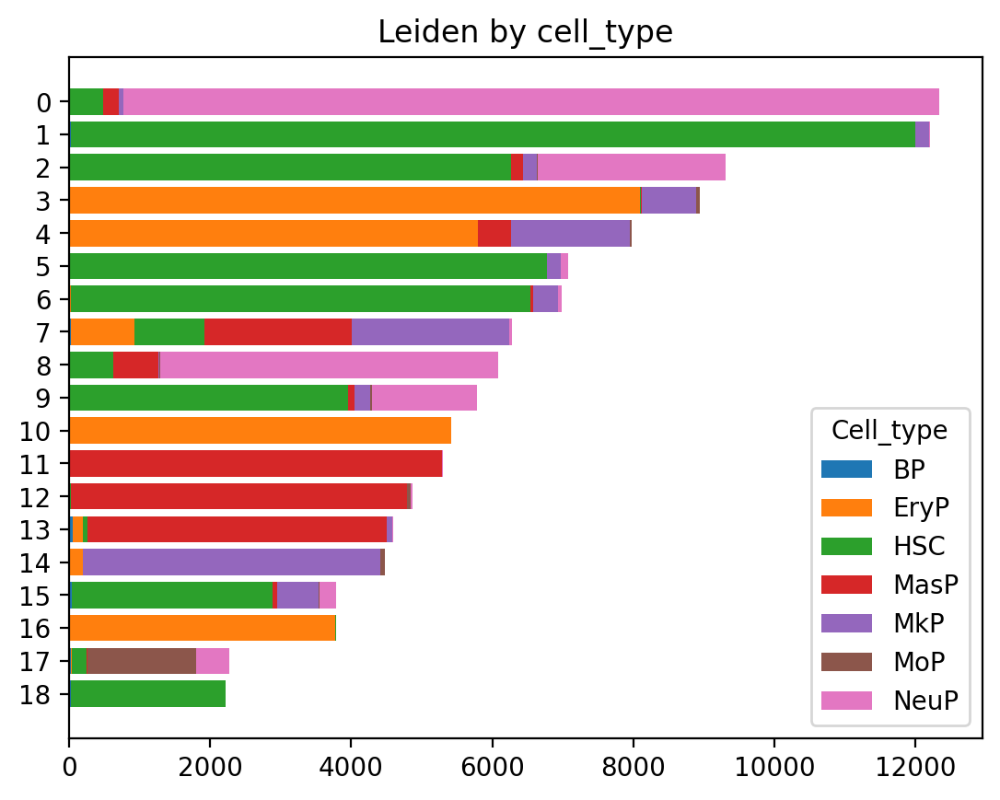

In [99]:
sc_utils.plot_composition(ds, group_by="leiden", color="cell_type")

<AxesSubplot: title={'center': 'Leiden by day'}>

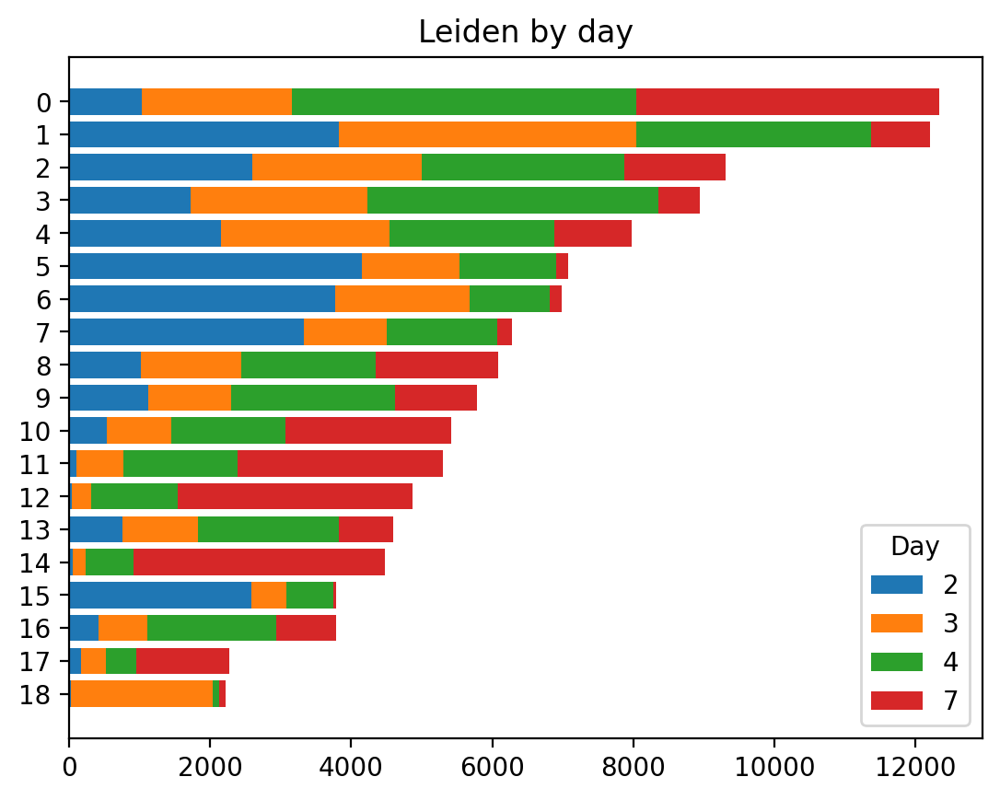

In [100]:
sc_utils.plot_composition(ds, group_by="leiden", color="day")

## 7. Dropout analysis per batch/cell_type

This is number of genes per cell per sample: i.e. number of non-zero entries per each cell.

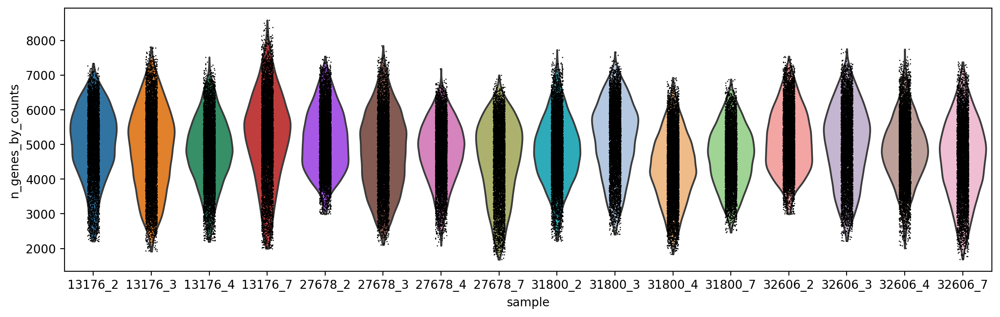

In [162]:
fig, ax = plt.subplots(figsize=(14, 4))
sc.pl.violin(ds, "n_genes_by_counts", groupby="sample", ax=ax)

**Conclusion**:
Sample 31800_4 has fewer genes, everything else looks similar

Let's check if cell type composition is different in that sample?

<AxesSubplot: title={'center': 'Sample by cell_type'}>

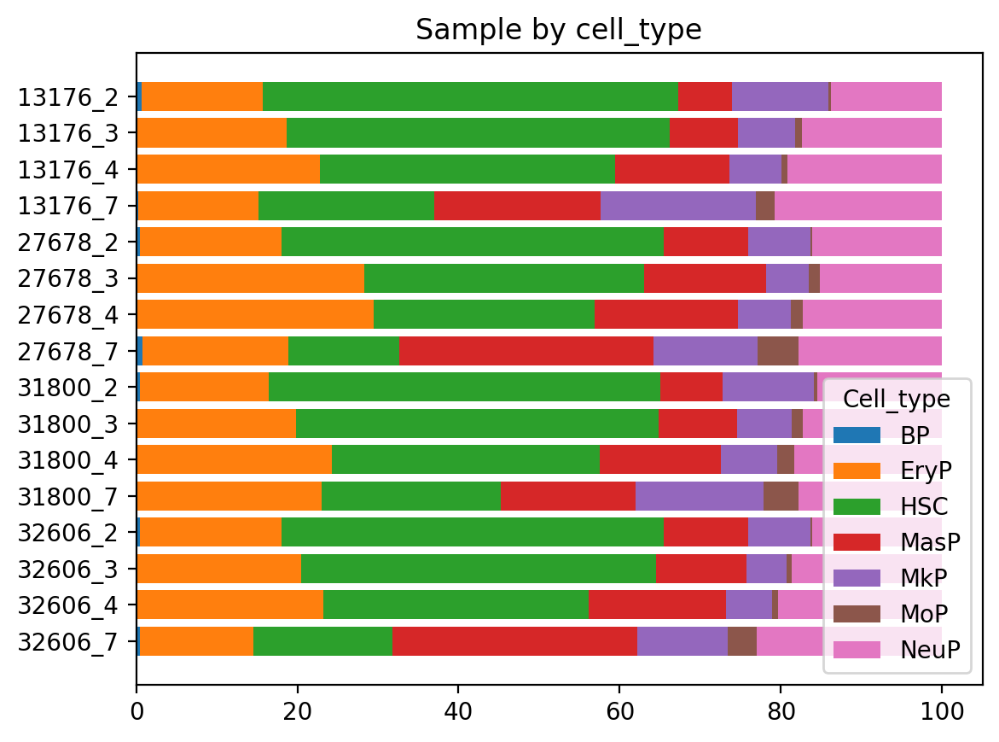

In [164]:
sc_utils.plot_composition(ds, group_by="sample", color="cell_type", relative=True)

In [165]:
ds.write_h5ad("../data/h5ad/rna.h5ad")